# 0. Настройка (Библиотеки, БД, Ключи, PROXY)

## Установка библиотек

In [1]:
#!pip install openai
#!pip install mistralai
#!pip install docx
#!pip install python-docx
#!pip install httpx_socks
#!pip install httpx[socks]
#!pip install httpcore[socks]
#!pip install --upgrade httpcore[socks]
#!pip install python-dotenv
#!pip install python-pptx

## Подключение библиотек 

In [2]:
# Работа с документами (Word, PowerPoint)
from docx import Document
from pptx import Presentation
from pptx.util import Inches

# Обработка изображений
from PIL import Image, ImageFont, ImageDraw, ImageFilter, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

# Работа с файлами и парсинг
import re
import json
from io import BytesIO
import os

# Базы данных
import psycopg2
from psycopg2.extras import DictCursor

# LLM (Language Models)
import openai
from openai import OpenAI, APIError
from mistralai import Mistral

# Сетевые запросы и прокси
import requests
import httpx
from requests.adapters import HTTPAdapter
from requests import Session
from httpx_socks import SyncProxyTransport
from urllib import request

# Прочие утилиты
import time
import random

## Ключи для работы LLM, Proxy

In [3]:
# Открываем файл t.env для чтения
with open("keys.env", "r") as file:
    # Читаем строки файла
    lines = file.readlines()

# Создаем словарь для хранения значений
config = {}

# Парсим каждую строку файла
for line in lines:
    # Убираем лишние пробелы и символы новой строки
    line = line.strip()
    if line and not line.startswith("#"):  # Игнорируем пустые строки и комментарии
        key, value = line.split("=", 1)  # Разделяем строку по первому знаку "="
        config[key] = value

# Присваиваем значения переменным
OPENAI_API_KEY = config.get("OPENAI_API_KEY")
Mistral_API_KEY = config.get("Mistral_API_KEY")
proxy = config.get("proxy")

# Выводим значения для проверки
#print(f"OPENAI_API_KEY: {OPENAI_API_KEY}")
#print(f"Mistral_API_KEY: {Mistral_API_KEY}")
#print(f"proxy: {proxy}")

## Параметры подключения к базе данных

In [4]:
conn_params = {
    'dbname': 'postgres',  # Имя вашей базы данных
    'user': 'robert',                # Имя пользователя PostgreSQL
    'password': 'vhk0506Ig6',        # Пароль пользователя
    'host': 'db_postgres',                # Хост (например, localhost)
    'port': 5432                     # Порт (по умолчанию 5432)
}

# 1. Данные о ЛОРе, персонажах, учебных материалах

## Данные о персонажах

In [5]:
characters = {"Вира": {
    "name": "Вира",
    "age": "14-16 лет",
    "gender": "Женщина",
    "ethnicity": "Европейская",
    "unique_traits": ["Фиолетовые глаза", "Механическая правая рука"],
    "appearance": {
      "height": "Невысокая",
      "build": "Стройная",
      "hair_color": "Светлые",
      "eye_color": "Фиолетовые",
      "clothing_style": "Удобная и стильная одежда в фиолетовой цветовой гамме",
      "accessories": ["Часы", "Очки для работы с технологиями"]
    },
    "personality": {
      "traits": ["Энергичная", "Творческая", "Справедливая"],
      "social_behavior": "Экстраверт",
      "strengths": ["Креативность", "Технические навыки", "Лидерские качества", "Чувство юмора"],
      "weaknesses": ["Пуглива при неожиданностях", "Категорична в вопросах справедливости"]
    },
    "background": {
      "family": "Родители поддерживают её интересы (папа — инженер, мама — моральная поддержка)",
      "significant_events": [
        "Получила механическую руку в раннем возрасте",
        "Создала собственные дроны и VR-шлемы",
        "Разработала дрона, победившего Арью"
      ]
    },
    "interests": ["Робототехника", "Дроны", "VR"]
  },
  "Арья": {
    "name": "Арья",
    "age": "14-16 лет",
    "gender": "Женщина",
    "ethnicity": "Европейская",
    "unique_traits": ["Отличные навыки стрельбы", "Строгий стиль одежды"],
    "appearance": {
      "height": "Среднего роста",
      "build": "Спортивная",
      "hair_color": "Русые",
      "eye_color": "Не указано",
      "clothing_style": "Белая футболка/блузка, черные брюки и пиджак, белая спортивная обувь",
      "accessories": []
    },
    "personality": {
      "traits": ["Целеустремленная", "Талантливая", "Защитница"],
      "social_behavior": "Интроверт",
      "strengths": ["Стрелковые навыки", "Верность", "Упорство"],
      "weaknesses": ["Беспокойство о будущем разлуке с братом"]
    },
    "background": {
      "family": "Близнец Дария",
      "significant_events": [
        "Ежегодный просмотр 'Назад в будущее'",
        "Участие в любительских соревнованиях по стрельбе"
      ]
    },
    "interests": ["Стрельба", "Вестерны"]
  },
  "Дарий": {
    "name": "Дарий",
    "age": "14-16 лет",
    "gender": "Мужчина",
    "ethnicity": "Европейская",
    "unique_traits": ["Талантливый конструктор", "Любовь к комбинезонам"],
    "appearance": {
      "height": "Среднего роста",
      "build": "Стройный",
      "hair_color": "Не указано",
      "eye_color": "Не указано",
      "clothing_style": "Комбинезоны различных моделей, много карманов для инструментов",
      "accessories": ["Мультитул", "Плоскогубцы", "Изолента"]
    },
    "personality": {
      "traits": ["Творческий", "Инженерный склад ума", "Целеустремленный"],
      "social_behavior": "Интроверт",
      "strengths": ["Конструирование", "Решение проблем", "Упорство"],
      "weaknesses": ["Перфекционизм в технических проектах"]
    },
    "background": {
      "family": "Близнец Арьи",
      "significant_events": [
        "Победы в соревнованиях дронов",
        "Создание дрона, который не могла сбить Арья"
      ]
    },
    "interests": ["Научная фантастика", "Конструирование", "Дроны"]
  },
   "Влад": {
    "name": "Влад",
    "age": "14-16 лет",
    "gender": "Мужчина",
    "ethnicity": "Европейская",
    "unique_traits": ["Стеснительность из-за внешности", "Спортивное телосложение"],
    "appearance": {
      "height": "Не указано",
      "build": "пухлый, особенно в области живота и плеч",
      "hair_color": "выбритая голова",
      "eye_color": "Не указано",
      "clothing_style": "серо-зеленый свитер с большим количеством темно-зеленых полосок, у свитера длинные рукава, темно-серые штаны с белыми полосками по бокам, белые кроссовки с зелеными вставками",
      "accessories": ["Наушники на шее"]
    },
    "personality": {
      "traits": ["Добрый", "Весёлый", "Готов помочь"],
      "social_behavior": "Интроверт",
      "strengths": ["Физическая сила", "Знание механики", "Защитник слабых"],
      "weaknesses": ["Стеснительность", "Низкая самооценка", "Вспыльчивость"]
    },
    "background": {
      "family": "Не указано",
      "significant_events": [
        "Инцидент с разбитой доской и окном из-за недоразумения",
        "Поддержка друзей во время конфликта с хулиганами"
      ]
    },
    "interests": ["Спорт", "Музыка", "Механика", "Автомобили"]
  },
  
  "Джесси": {
    "name": "Джесси",
    "age": "14 лет",
    "gender": "Женщина",
    "ethnicity": "Европейская",
    "unique_traits": ["Огненно-рыжие волосы", "Скейтерский стиль"],
    "appearance": {
      "height": "Не указано",
      "build": "Не указано",
      "hair_color": "Огненно-рыжие",
      "eye_color": "Не указано",
      "clothing_style": "Классический олдскул: футболки, рубашки, джинсы, шорты",
      "accessories": ["Шнурок вместо ремня"]
    },
    "personality": {
      "traits": ["Свободолюбивая", "Открытая", "Приключенческий дух"],
      "social_behavior": "Экстраверт",
      "strengths": ["Ловкость", "Командный игрок", "Тяга к знаниям"],
      "weaknesses": ["Низкий болевой порог", "Чрезмерная импульсивность"]
    },
    "background": {
      "family": "Любящие родители, хорошее образование",
      "significant_events": [
        "Работа над экспериментальным проектом для профессора"
      ]
    },
    "interests": ["Эксперименты", "Приключения", "Командные виды спорта"]
  },
  
  "Джей": {
    "name": "Джей",
    "age": "14-16 лет",
    "gender": "Мужчина",
    "ethnicity": "Европейская",
    "unique_traits": ["Белые волосы", "Чёрная одежда"],
    "appearance": {
      "height": "Не указано",
      "build": "Не указано",
      "hair_color": "Белые",
      "eye_color": "Синие",
      "clothing_style": "Черная толстовка с капюшоном поверх белой футболки, все молнии на толстовке полностью застегнуты, толстовка плотно застегнута, черные брюки-карго с множеством карманов и аксессуаром на цепочке",
      "accessories": ["черный рюкзак"]
    },
    "personality": {
      "traits": ["Наблюдательный", "Справедливый", "Целеустремленный"],
      "social_behavior": "Интроверт",
      "strengths": ["3D моделирование", "Программирование", "Игры"],
      "weaknesses": ["Трудно переносит ошибки", "Излишняя прямота"]
    },
    "background": {
      "family": "Учился сдержанности у отца, стремление к высотам от матери",
      "significant_events": []
    },
    "interests": ["Программирование", "3D моделирование", "Игры"]
  },
  "Пай": {
    "name": "Пай",
    "age": "14-16 лет",
    "gender": "Женщина",
    "ethnicity": "Азиатская",
    "unique_traits": ["Тусклая одежда холодных тонов", "Всегда в наушниках"],
    "appearance": {
      "height": "Не указано",
      "build": "Не указано",
      "hair_color": "Не указано",
      "eye_color": "Не указано",
      "clothing_style": "Худи и джинсы холодных оттенков",
      "accessories": ["Наушники"]
    },
    "personality": {
      "traits": ["Расчетливая", "Логичная", "Прямолинейная"],
      "social_behavior": "Интроверт",
      "strengths": ["Программирование", "Математика", "Информатика"],
      "weaknesses": ["Неприятие гуманитарных наук", "Вспыльчивость"]
    },
    "background": {
      "family": "Не указано",
      "significant_events": [
        "Создание компьютерного вируса после конфликта в классе"
      ]
    },
    "interests": ["Программирование", "Искусственный интеллект", "Математика"]
  },
  
  "Руфи": {
    "name": "Руфи",
    "age": "14-16 лет",
    "gender": "Женщина",
    "ethnicity": "Европейская",
    "unique_traits": ["Одежда с логотипами любимой игры", "Предпочитает одиночество"],
    "appearance": {
      "height": "Не указано",
      "build": "Не указано",
      "hair_color": "Не указано",
      "eye_color": "Не указано",
      "clothing_style": "Спортивный костюм с символикой любимой игры",
      "accessories": []
    },
    "personality": {
      "traits": ["Замкнутая", "Талантливая", "Чуткая"],
      "social_behavior": "Интроверт",
      "strengths": ["Киберспорт", "Игра на барабанах", "Языки"],
      "weaknesses": ["Сложности в реальном общении", "Эмоциональная чувствительность"]
    },
    "background": {
      "family": "Не указано",
      "significant_events": [
        "Пережила социальную изоляцию",
        "Преодолела зависимость от игр"
      ]
    },
    "interests": ["Киберспорт", "Музыка", "Языки"]
  },
  
  "Тоня": {
    "name": "Тоня",
    "age": "14-16 лет",
    "gender": "Женщина",
    "ethnicity": "Европейская",
    "unique_traits": ["Любовь к сине-белой цветовой гамме", "Стремление к совершенству"],
    "appearance": {
      "height": "Не указано",
      "build": "Полная фигура",
      "hair_color": "Не указано",
      "eye_color": "Не указано",
      "clothing_style": "Качественная одежда сине-белых оттенков",
      "accessories": ["Часы", "Очки"]
    },
    "personality": {
      "traits": ["Целеустремленная", "Общительная", "Ответственная"],
      "social_behavior": "Экстраверт",
      "strengths": ["Программирование", "Физика", "Эмпатия"],
      "weaknesses": ["Чрезмерная привязчивость", "Долгие обиды"]
    },
    "background": {
      "family": "Из семьи врачей",
      "significant_events": []
    },
    "interests": ["Искусственный интеллект", "Медицина", "Физика"]
  },
  
  "Юра": {
    "name": "Юра",
    "age": "14-16 лет",
    "gender": "Мужчина",
    "ethnicity": "Европейская",
    "unique_traits": ["Постоянные тренировки", "Уверенность в своей правоте"],
    "appearance": {
      "height": "Не указано",
      "build": "Спортивная",
      "hair_color": "Не указано",
      "eye_color": "Не указано",
      "clothing_style": "Комфортная одежда нейтральных тонов",
      "accessories": []
    },
    "personality": {
      "traits": ["Независимый", "Целеустремленный", "Упрямый"],
      "social_behavior": "Интроверт",
      "strengths": ["Танцы", "Строительные навыки", "Лидерские качества"],
      "weaknesses": ["Неприятие чужих советов", "Сложности с признанием ошибок"]
    },
    "background": {
      "family": "Живет с матерью",
      "significant_events": [
        "Инцидент с проектом спортзала"
      ]
    },
    "interests": ["Брейкданс", "Строительство", "Литература"]
  }
}

## ЛОР мира

In [6]:
world_description = {
    "name": "Вавилон (техно хогвартс)",
    "summary": (
        "Технологически продвинутый город, где вся инфраструктура завязана на ИИ. "
        "Центральным местом является уникальная школа Вавилон - огромный комплекс, "
        "обучающий более 20,000 учеников. Школа управляется людьми при помощи ИИ, "
        "способна изменять конструкцию и окружающую территорию. Для управления используется "
        "система БУМов (Блоков управляющего модуля). Действие начинается с того, что Джей "
        "становится свидетелем заговора против директора. Герои из двух миров объединяются, "
        "чтобы раскрыть планы злоумышленников и спасти пропавшего товарища."
    ),
    "key_features": [
        "Полное технологическое управление городом через ИИ",
        "Школа Вавилон как центр обучения программированию и взаимодействия с ИИ",
        "Система БУМов для управления ИИ",
        "Способность школы к трансформации и созданию предметов"
    ],
    "main_conflict": (
        "Заговор Эмиля против директора школы, похищение Джея, "
        "межпространственная помощь героев из разных миров"
    ),
    "resolution": (
        "Раскрытие заговора, освобождение Джея, восстановление справедливости "
        "и возвращение героев в свой мир"
    )
}

## Персонажи-участники в данной новелле

In [7]:
character1 = characters["Джей"]
character2 = characters["Влад"]


print("Персонаж 1:")
print(character1)
print("\nПерсонаж 2:")
print(character2)

Персонаж 1:
{'name': 'Джей', 'age': '14-16 лет', 'gender': 'Мужчина', 'ethnicity': 'Европейская', 'unique_traits': ['Белые волосы', 'Чёрная одежда'], 'appearance': {'height': 'Не указано', 'build': 'Не указано', 'hair_color': 'Белые', 'eye_color': 'Синие', 'clothing_style': 'Черная толстовка с капюшоном поверх белой футболки, все молнии на толстовке полностью застегнуты, толстовка плотно застегнута, черные брюки-карго с множеством карманов и аксессуаром на цепочке', 'accessories': ['черный рюкзак']}, 'personality': {'traits': ['Наблюдательный', 'Справедливый', 'Целеустремленный'], 'social_behavior': 'Интроверт', 'strengths': ['3D моделирование', 'Программирование', 'Игры'], 'weaknesses': ['Трудно переносит ошибки', 'Излишняя прямота']}, 'background': {'family': 'Учился сдержанности у отца, стремление к высотам от матери', 'significant_events': []}, 'interests': ['Программирование', '3D моделирование', 'Игры']}

Персонаж 2:
{'name': 'Влад', 'age': '14-16 лет', 'gender': 'Мужчина', 'ethn

<h4> Тестирование подключения

In [8]:
try:
    # Попытка подключения к базе данных
    conn = psycopg2.connect(**conn_params)
    print("Соединение с базой данных успешно установлено!")

    # Закрытие соединения
    conn.close()
    print("Соединение закрыто.")

except Exception as e:
    print(f"Ошибка при подключении к базе данных: {e}")

Соединение с базой данных успешно установлено!
Соединение закрыто.


# 2. Операции с файлами (функции чтения и записи)

<h4> Чтение файла

In [9]:
def read_doc(file_path):
    """
    Чтение DOCX файла.
    :param file_path: Путь к файлу.
    :return: Текст из файла.
    """
    try:
        doc = Document(file_path)
        full_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])
        return full_text.strip()
    except Exception as e:
        raise RuntimeError(f"Ошибка при чтении DOCX-файла: {e}")

<h4> Запись в файл

In [10]:
def write_doc(file_path, text):
    """
    Запись текста в новый DOCX файл.
    :param file_path: Путь для сохранения нового DOCX файла.
    :param text: Текст для записи.
    """
    try:
        doc = Document()
        doc.add_paragraph(text)
        doc.save(file_path)
    except Exception as e:
        raise RuntimeError(f"Ошибка при записи DOCX-файла: {e}")

# 3. Суммаризация лекционных материалов

## Функция суммаризации- summarize_text_with_openai

In [11]:
def summarize_text_with_openai(text, api_key, model="gpt-4o", max_tokens=1500, proxy=None):
    # Создаем HTTP-клиент с поддержкой прокси
    if proxy:
        # Настройка прокси через httpx.Proxy и Transport
        proxies = {
            "http://": proxy,
            "https://": proxy
        }
        transport = httpx.HTTPTransport(retries=3, proxy=httpx.Proxy(proxy))
        http_client = httpx.Client(transport=transport, timeout=30.0)  # Устанавливаем таймаут
    else:
        http_client = httpx.Client(timeout=30.0)

    # Инициализация клиента OpenAI
    client = openai.OpenAI(
        api_key=api_key,
        http_client=http_client  # Передаем HTTP-клиент
    )

    try:
        # Инструкция для модели
        instruction = """
        Ты помощник по проведению суммаризации текста.
        Раздели научную лекцию на составляющие части, сохраняя учебную и научную ценность, при этом сокращая объем научного текста.
        Действия для разделения лекции:
        1) Определи основную тему лекции и выдели ключевые понятия, которые необходимо сохранить.
        2) Раздели лекцию на логические блоки:
           - Введение (краткое описание темы и ее актуальности)
           - Теоретическая часть (основные концепции и теории)
           - Практическая часть (примеры, кейсы, эксперименты)
           - Заключение (итоги и выводы)
        3) Сократи научный текст:
           - Удали ненужные подробности и второстепенные детали.
           - Используй краткие формулировки и определения.
           - Замени длинные описания на схемы, диаграммы или иллюстрации, если это возможно.
        4) Сохрани учебную и научную ценность:
           - Обязательно включи ключевые термины и понятия.
           - Подчеркни важность темы и ее практическое применение.
           - Предоставь рекомендации для дальнейшего изучения или дополнительные ресурсы.
        5) Проверь и отредактируй содержание:
           - Убедись, что все части логически связаны и легко понятны.
           - Проверь на наличие ошибок и несоответствий.
        Результат: Краткое содержание научной лекции.
        Сама лекция: \n{text}"
        """

        response = client.chat.completions.create(
            model=model,
            messages=[
                {"role": "system", "content": "Ты помощник по проведению суммаризации текста."},
                {"role": "user", "content": f"{instruction}\n{text}"}
            ],
            max_tokens=max_tokens
        )
        summarized_text = response.choices[0].message.content.strip()
        return summarized_text

    except APIError as e:
        raise RuntimeError(f"Ошибка при запросе к OpenAI API: {e}")

## Суммаризация лекции в файле - Сlass DocSummarizer

In [12]:
class DocSummarizer:
    def __init__(self, api_key):
        """
        Инициализация класса.
        :param api_key: API-ключ OpenAI.
        """
        if not api_key:
            raise ValueError("API-ключ OpenAI обязателен.")
        self.api_key = api_key

    def process(self, input_file, output_file, max_tokens=150, proxy=None):
        """
        Основной метод для обработки DOCX файла.
        :param input_file: Путь к входному DOCX файлу.
        :param output_file: Путь для сохранения нового DOCX файла.
        :param max_tokens: Максимальное количество токенов в суммаризованном тексте.
        :param proxy: Прокси-сервер для OpenAI API.
        """
        try:
            text = read_doc(input_file)
        except Exception as e:
            raise RuntimeError(f"Ошибка при чтении DOCX-файла: {e}")

        try:
            summarized_text = summarize_text_with_openai(
                text, self.api_key, max_tokens=max_tokens, proxy=proxy
            )
        except Exception as e:
            raise RuntimeError(f"Ошибка при суммаризации текста через OpenAI API: {e}")

        try:
            write_doc(output_file, summarized_text)
        except Exception as e:
            raise RuntimeError(f"Ошибка при записи DOCX-файла: {e}")

        print(f"Суммаризованный текст успешно сохранен в {output_file}")

# 4. Генерация сюжета - Class DocScenari 

## Class DocScenari 

In [13]:
class DocScenari:
    def __init__(self, api_key):
        if not api_key:
            raise ValueError("API-ключ OpenAI обязателен.")
        self.api_key = api_key

    def _scenari_with_openai(self, text, nauchtxt, p1, p2, world2, max_tokens=1500, proxy=None):
        if proxy:
            transport = httpx.HTTPTransport(retries=3, proxy=httpx.Proxy(proxy))
            http_client = httpx.Client(transport=transport, timeout=30.0)
        else:
            http_client = httpx.Client(timeout=30.0)

        client = openai.OpenAI(
            api_key=self.api_key,
            http_client=http_client
        )

        instruction = """
        Цель: Создать сюжет новеллы, который включает научную лекцию и персонажей.
        
        Входные данные:
        - Краткое описание научной лекции:  \n{text}
        - Полное описание научной лекции:  \n{nauchtxt}
        - Описание персонажа 1:  \n{p1}
        - Описание персонажа 2:  \n{p2}
        - Мир, в котором происходит новелла:  \n{world2}

        Действия:
        1. Разработайте основную идею сюжета:
           - Как ключевые научные концепции из лекции могут быть использованы для создания увлекательного повествования?
           - Какие конфликты или проблемы могут возникнуть из-за этих концепций?
        2. Создайте сюжетную линию:
           - Как персонажи будут взаимодействовать с научными концепциями?
           - Какие отношения между персонажами будут развиваться или меняться?
           - Какие повороты сюжета могут произойти?
        3. Включите научные элементы в повествование:
           - Используйте научные термины и концепции для создания реалистичной обстановки.
           - Объясняйте сложные научные понятия простым языком через диалог или мысли персонажей.
        4. Сохраните логическую связь и увлекательность:
           - Убедитесь, что сюжет логичен и интересен.
           - Проверьте на наличие несоответствий и ошибок.
           - Используй только 2 персонажей которые даны в вводных данных.
        
        Результат: Готовый сюжет новеллы, который включает научную лекцию и только 2 персонажей.
        """

        formatted_instruction = instruction.format(
            text=text,
            nauchtxt=nauchtxt,
            p1=p1,
            p2=p2,
            world2=world2
        )

        try:
            response = client.chat.completions.create(
                model="gpt-4o",
                messages=[
                    {"role": "system", "content": "Ты помощник по созданию сюжетов для научных новелл."},
                    {"role": "user", "content": formatted_instruction}
                ],
                max_tokens=max_tokens
            )
            return response.choices[0].message.content.strip()
        except APIError as e:
            raise RuntimeError(f"Ошибка при запросе к OpenAI API: {e}")

    def process(self, summary_file, full_description_file, output_file, p1, p2, world2, max_tokens=1500, proxy=None):
        try:
            text_summary = read_doc(summary_file)
        except Exception as e:
            raise RuntimeError(f"Ошибка при чтении файла с кратким описанием: {e}")

        try:
            nauchtxt = read_doc(full_description_file)
        except Exception as e:
            raise RuntimeError(f"Ошибка при чтении файла с полным описанием: {e}")

        try:
            scenari_text = self._scenari_with_openai(
                text=text_summary,
                nauchtxt=nauchtxt,
                p1=p1,
                p2=p2,
                world2=world2,
                max_tokens=max_tokens,
                proxy=proxy
            )
        except Exception as e:
            raise RuntimeError(f"Ошибка при генерации сюжета через OpenAI API: {e}")

        try:
            write_doc(output_file, scenari_text)
        except Exception as e:
            raise RuntimeError(f"Ошибка при записи DOC-файла: {e}")

        print(f"Сгенерированный сюжет успешно сохранен в {output_file}")


# 5. Генерация сценария - generate_scenario

In [14]:
def generate_scenario(plot, lecture_summary, character1, character2, world_description, api_key, model="gpt-4o", max_tokens=1500, proxy=None):
    """
    Генерирует сценарий на основе входных данных через OpenAI API.
    :param plot: Основной сюжет сценария.
    :param lecture_summary: Краткое описание научной лекции.
    :param character1: Описание первого персонажа.
    :param character2: Описание второго персонажа.
    :param world_description: Описание мира.
    :param api_key: API-ключ OpenAI.
    :param model: Модель OpenAI для генерации.
    :param max_tokens: Максимальное количество токенов в ответе.
    :param proxy: Прокси-сервер для OpenAI API.
    :return: Сгенерированный текст сценария.
    """
    # Создаем HTTP-клиент с поддержкой прокси
    if proxy:
        transport = httpx.HTTPTransport(retries=3, proxy=httpx.Proxy(proxy))
        http_client = httpx.Client(transport=transport, timeout=30.0)  # Устанавливаем таймаут
    else:
        http_client = httpx.Client(timeout=30.0)

    # Инициализация клиента OpenAI
    client = OpenAI(api_key=api_key, http_client=http_client)

    instruction = """
    Цель: Создать сценарий, разбитый на главы, каждая из которых объединяет несколько сцен.
    Для генерации используйте только входные данные.

    Входные данные:
    - Основной сюжет: {plot}
    - Научная лекция: {lecture_summary}
    - Персонажи:
      - Персонаж 1: {character1}
      - Персонаж 2: {character2}
    - Мир: {world_description}

    Структура повествования:
    1. Экспозиция: Введение в мир и персонажей.
    2. Развитие действия: Основные события и конфликты.
    3. Кульминация: Самый напряженный момент.
    4. Решение: Разрешение конфликтов.

    Действия:
    1. Определите ключевые события или конфликты для каждой главы.
    2. Разбейте сюжет на главы:
       - Глава 1: Введение.
       - Глава 2: Начало конфликта.
       - Глава 3: Развитие действия.
       - Глава 4: Кульминация.
       - Глава 5: Решение.
    3. Опишите содержание каждой главы.
    - Убедитесь, что каждая глава имеет четкую цель и развитие сюжета.
    4. Отредактируйте и доработайте структуру:
       - Проверьте на наличие несоответствий и ошибок.
       - Убедитесь, что все главы логически связаны и увлекательны.
       - Убедитесь что вы используете только 2 персонажей : {character2} , {character1}

    Результат: Полный сценарий, разбитый на главы.
    """
    # Форматируем инструкцию с переданными параметрами
    formatted_instruction = instruction.format(
        plot=plot,
        lecture_summary=lecture_summary,
        character1=character1,
        character2=character2,
        world_description=world_description
    )
    print(formatted_instruction)

    try:
        response = client.chat.completions.create(
            model=model,
            messages=[
                {"role": "system", "content": "Ты помощник по созданию сценариев."},
                {"role": "user", "content": formatted_instruction}
            ],
            max_tokens=max_tokens
        )
        scenario = response.choices[0].message.content.strip()
        return scenario

    except APIError as e:
        raise RuntimeError(f"Ошибка при запросе к OpenAI API: {e}")

# 6. Прегенерация глав - Class ScenarioGenerator

In [15]:
class ScenarioGenerator:
    def __init__(self, api_key):
        """
        Инициализация класса.
        :param api_key: API-ключ OpenAI.
        """
        if not api_key:
            raise ValueError("API-ключ OpenAI обязателен.")
        self.api_key = api_key

    def process(self, plot_file, lecture_file, output_file, characters, world_desc, max_tokens=1500, proxy=None):
        """
        Основной метод для обработки DOCX файлов.
        :param plot_file: Путь к файлу с описанием сюжета.
        :param lecture_file: Путь к файлу с кратким описанием научной лекции.
        :param output_file: Путь для сохранения нового DOCX файла.
        :param characters: Словарь с описанием персонажей.
        :param world_desc: Описание мира.
        :param max_tokens: Максимальное количество токенов.
        :param proxy: Прокси-сервер для OpenAI API.
        """
        try:
            plot = read_doc(plot_file)
        except Exception as e:
            raise RuntimeError(f"Ошибка при чтении файла сюжета: {e}")

        try:
            lecture_summary = read_doc(lecture_file)
        except Exception as e:
            raise RuntimeError(f"Ошибка при чтении файла лекции: {e}")

        try:
            scenario = generate_scenario(
                plot=plot,
                lecture_summary=lecture_summary,
                character1=characters["Джей"],
                character2=characters["Влад"],
                world_description=world_desc,
                api_key=self.api_key,
                model="gpt-4o",
                max_tokens=max_tokens,
                proxy=proxy
            )
        except Exception as e:
            raise RuntimeError(f"Ошибка при генерации сценария через OpenAI: {e}")

        try:
            write_doc(output_file, scenario)
        except Exception as e:
            raise RuntimeError(f"Ошибка при записи DOCX-файла: {e}")

        print(f"Сценарий успешно сохранен в {output_file}")

def split_into_chapters(full_text: str) -> list[dict]:
    """
    Разбивает текст на главы, где каждая начинается с "Глава X:".
    Возвращает список словарей (номер главы и её содержание).
    """
    chapter_matches = list(re.finditer(r'Глава \d+:', full_text))
    
    if not chapter_matches:
        return []  # Если глав нет
    
    chapters = []
    for i, match in enumerate(chapter_matches):
        start_pos = match.start()
        chapter_number = int(match.group().split()[1].rstrip(':'))
        
        if i < len(chapter_matches) - 1:
            end_pos = chapter_matches[i + 1].start()
            chapter_text = full_text[start_pos:end_pos].strip()
        else:
            chapter_text = full_text[start_pos:].strip()
        
        chapters.append({"chapter_number": chapter_number, "content": chapter_text})
    
    return chapters



# 7. Генерация сцен для главы - generate_scenes_for_chapter

In [16]:
def generate_scenes_for_chapter(chapter_text, previous_chapter_summary, characters, world_description, api_key, model="gpt-4o", max_tokens=1500, proxy=None):
    """
    Генерирует сцены для главы на основе входных данных через OpenAI API.
    :param chapter_text: Текст текущей главы.
    :param previous_chapter_summary: Краткое содержание предыдущей главы.
    :param characters: Словарь с описанием персонажей.
    :param world_description: Описание мира.
    :param api_key: API-ключ OpenAI.
    :param model: Модель OpenAI для генерации.
    :param max_tokens: Максимальное количество токенов в ответе.
    :param proxy: Прокси-сервер для OpenAI API.
    :return: Сгенерированный текст сцен.
    """
    # Создаем HTTP-клиент с поддержкой прокси
    if proxy:
        transport = httpx.HTTPTransport(retries=3, proxy=httpx.Proxy(proxy))
        http_client = httpx.Client(transport=transport, timeout=30.0)  # Устанавливаем таймаут
    else:
        http_client = httpx.Client(timeout=30.0)

    # Инициализация клиента OpenAI
    client = OpenAI(api_key=api_key, http_client=http_client)

    instruction = """
    Цель: Разбить главу на сцены, каждая из которых описывает конкретное место действия и события, происходящие в одно время, учитывая события прошлой сцены.

    Входные данные:
    - Что произошло в прошлой главе: {previous_chapter_summary}
    - Персонажи:
      - Джей: {character1}
      - Влад: {character2}
    - Мир: {world_description}
    - Текущая глава: {chapter_text}

    Действия:
    1. Определите ключевые события в главе:
       - Какие основные события или конфликты будут развиваться в этой главе?
       - Как персонажи будут взаимодействовать с научными концепциями?
    2. Разбейте главу на сцены:
       - Сцена 1: Введение в место действия и персонажей.
       - Сцена 2: Введение основного конфликта или проблемы.
       - Сцена 3: Развитие действия и конфликтов.
       - Сцена 4: Кульминация или поворот сюжета.
       - Сцена 5: Решение или переход к следующей главе.
    3. Опишите мизансцену для каждой сцены:
       - Место действия: Опишите окружение и обстановку.
       - Положение персонажей: Опишите, где находятся персонажи и как они взаимодействуют с окружением.
       - Эмоциональное состояние: Опишите эмоции и настроения персонажей.
       - Визуальные детали: Опишите любые важные визуальные элементы (свет, цвета, текстуры).
    4. Создайте диалоги для каждой сцены:
       - Разговоры между персонажами: Разделите на реплики.
       - Изменения в мизансцене: Обозначьте, как диалог влияет на положение персонажей или окружение.
    5. Опишите изменения в действии или положении персонажей:
       - Как персонажи меняются или развиваются в каждой сцене?
       - Какие ключевые события или открытия происходят?
    6. Отредактируйте и доработайте сцены:
       - Убедитесь, что каждая сцена логически связана с предыдущей и следующей.
       - Проверьте на наличие несоответствий и ошибок.

    Результат: Глава, разбитая на сцены, каждая из которых содержит мизансцену, диалоги и изменения в действии или положении персонажей.
    """
    # Форматируем инструкцию с переданными параметрами
    formatted_instruction = instruction.format(
        previous_chapter_summary=previous_chapter_summary,
        character1=characters["Джей"],
        character2=characters["Влад"],
        world_description=world_description,
        chapter_text=chapter_text
    )
    print(formatted_instruction)

    try:
        response = client.chat.completions.create(
            model=model,
            messages=[
                {"role": "system", "content": "Ты помощник по созданию сценариев."},
                {"role": "user", "content": formatted_instruction}
            ],
            max_tokens=max_tokens
        )
        scenes = response.choices[0].message.content.strip()
        return scenes

    except APIError as e:
        raise RuntimeError(f"Ошибка при запросе к OpenAI API: {e}")

# 8. Функции генерации комикса

## Функции для чтения и сохранения файлов формата doc

In [17]:
from docx import Document

def read_doc(file_path):
    """
    Чтение DOCX файла.
    :param file_path: Путь к файлу.
    :return: Текст из файла.
    """
    try:
        doc = Document(file_path)
        full_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])
        return full_text.strip()
    except Exception as e:
        raise RuntimeError(f"Ошибка при чтении DOCX-файла: {e}")

def write_doc(file_path, text):
    """
    Запись текста в новый DOCX файл.
    :param file_path: Путь для сохранения нового DOCX файла.
    :param text: Текст для записи.
    """
    try:
        doc = Document()
        doc.add_paragraph(text)
        doc.save(file_path)
    except Exception as e:
        raise RuntimeError(f"Ошибка при записи DOCX-файла: {e}")

## Формирование промта
Функция для генерации промта на основе данных об указанном персонаже

In [18]:
def prompt_for_generate_image(character) -> str:
    return f"""Изображая персонажа с именем "{character["name"]}", нужно учесть следующие особенности внешнего вида:
Персонаж "{character["name"]}" имеет возраст: {character["age"]}.
Пол персонажа "{character["name"]}": {character["gender"]}
Внешность персонажа "{character["name"]}": {character["ethnicity"]}
Рост персонажа "{character["name"]}": {character["appearance"]["height"]}
Комплекция (фигура тела) персонажа "{character["name"]}": {character["appearance"]["build"]}
Волосы персонажа "{character["name"]}": {character["appearance"]["hair_color"]}
Цвет глаз персонажа "{character["name"]}": {character["appearance"]["eye_color"]}
Одежда персонажа "{character["name"]}": {character["appearance"]["clothing_style"]}
Отличительные черты персонажа "{character["name"]}": {character["appearance"]["accessories"]}
"""

## Функции для работы с Mistral

### query_llm - отправка текстового запроса и возврат ответа на него

In [19]:
model = "mistral-small-latest"

client = Mistral(api_key=Mistral_API_KEY)

def query_llm(prompt) -> str:
    chat_response = client.chat.complete(
        model= model,
        messages = [
            {
                "role": "user",
                "content": prompt,
            },
        ]
    )
    return chat_response.choices[0].message.content

### `translate_text_on_eng` - запрос на перевод текста, указанного в параметрах, при помощи Mistral

In [20]:
def translate_text_on_eng(text) -> str:
    return query_llm("""Переведи на английский язык текст и напиши только ответ:

-------
""" + text)

## Функции для работы с FLUX

`queue_prompt` - отправка запроса на генерацию изображения и вывод prompt_id, который был присвоен данному запросу
функция get_image_generated_from_text, выполняющая следующие действия:
1) отправка запроса к http://comfyui:8188/prompt с помощью queue_prompt
2) ожидание того момента, когда присвоенный prompt_id отобразится в http://comfyui:8188/history/

именно в этот момент картинка будет сгенерирована

когда в ответе history появится указанный prompt_id, там же можно будет узнать имя созданной картинки

3) отправка запроса к https://photo.story-tech.ru/api/tasks в тот момент, когда картинка создалась

Это позволит установленному на сервере Photofield отсканировать имеющиеся картинки и отобразить ту картинку, которая была только что сгенерирована FLUX

**Результат работы**: имя сгенерированной картинки

In [21]:
# Новый JSON-промпт, соответствующий предоставленному API
BASE_PROMPT_IMAGE_TEXT = """
{

  "5": {
    "inputs": {
      "width": 1024,
      "height": 768,
      "batch_size": 1
    },
    "class_type": "EmptyLatentImage",
    "_meta": {
      "title": "Empty Latent Image"
    }
  },
  "6": {
    "inputs": {
      "text": "",
      "clip": [
        "11",
        0
      ]
    },
    "class_type": "CLIPTextEncode",
    "_meta": {
      "title": "CLIP Text Encode (Prompt)"
    }
  },
  "8": {
    "inputs": {
      "samples": [
        "13",
        0
      ],
      "vae": [
        "10",
        0
      ]
    },
    "class_type": "VAEDecode",
    "_meta": {
      "title": "VAE Decode"
    }
  },
  "9": {
    "inputs": {
      "filename_prefix": "jupyter/jupyter",
      "images": [
        "8",
        0
      ]
    },
    "class_type": "SaveImage",
    "_meta": {
      "title": "Save Image"
    }
  },
  "10": {
    "inputs": {
      "vae_name": "ae.safetensors"
    },
    "class_type": "VAELoader",
    "_meta": {
      "title": "Load VAE"
    }
  },
  "11": {
    "inputs": {
      "clip_name1": "t5xxl_fp16.safetensors",
      "clip_name2": "clip_l.safetensors",
      "type": "flux",
      "device": "default"
    },
    "class_type": "DualCLIPLoader",
    "_meta": {
      "title": "DualCLIPLoader"
    }
  },
  "12": {
    "inputs": {
      "unet_name": "flux1-dev.safetensors",
      "weight_dtype": "default"
    },
    "class_type": "UNETLoader",
    "_meta": {
      "title": "Load Diffusion Model"
    }
  },
  "13": {
    "inputs": {
      "noise": [
        "25",
        0
      ],
      "guider": [
        "22",
        0
      ],
      "sampler": [
        "16",
        0
      ],
      "sigmas": [
        "17",
        0
      ],
      "latent_image": [
        "5",
        0
      ]
    },
    "class_type": "SamplerCustomAdvanced",
    "_meta": {
      "title": "SamplerCustomAdvanced"
    }
  },
  "16": {
    "inputs": {
      "sampler_name": "euler"
    },
    "class_type": "KSamplerSelect",
    "_meta": {
      "title": "KSamplerSelect"
    }
  },
  "17": {
    "inputs": {
      "scheduler": "simple",
      "steps": 20,
      "denoise": 1,
      "model": [
        "12",
        0
      ]
    },
    "class_type": "BasicScheduler",
    "_meta": {
      "title": "BasicScheduler"
    }
  },
  "22": {
    "inputs": {
      "model": [
        "12",
        0
      ],
      "conditioning": [
        "26",
        0
      ]
    },
    "class_type": "BasicGuider",
    "_meta": {
      "title": "BasicGuider"
    }
  },
  "25": {
    "inputs": {
      "noise_seed": 700913015534956
    },
    "class_type": "RandomNoise",
    "_meta": {
      "title": "RandomNoise"
    }
  },
  "26": {
    "inputs": {
      "guidance": 14.5,
      "conditioning": [
        "6",
        0
      ]
    },
    "class_type": "FluxGuidance",
    "_meta": {
      "title": "FluxGuidance"
    }
  }
}
"""

def queue_prompt(image_description, width, height, seed):
    # Загрузка промпта из JSON
    prompt = json.loads(BASE_PROMPT_IMAGE_TEXT)
    # Установка текста для позитивного промпта
    prompt["6"]["inputs"]["text"] = image_description
    # Установка ширины
    prompt["5"]["inputs"]["width"] = width
    # Установка высоты
    prompt["5"]["inputs"]["height"] = height
    # Установка сида для KSampler
    prompt["25"]["inputs"]["noise_seed"] = seed
    # Количество шагов
    prompt["17"]["inputs"]["steps"] = 36
    p = {"prompt": prompt}
    data = json.dumps(p).encode('utf-8')
    req = request.Request("http://comfyui:8188/prompt", data=data)
    data = request.urlopen(req)
    answer = json.loads(data.read().decode('utf-8'))
    return answer["prompt_id"]

def get_image_generated_from_text(image_description, width=1024, height=768, seed=145153124382):
    # Отправка запроса
    prompt_id = queue_prompt(image_description, width, height, seed)

    image_generate_continue = False

    while not image_generate_continue:
        # ждём пять секунд
        time.sleep(60)

        # Уточнение названия изображения
        url = "http://comfyui:8188/history/" + prompt_id

        session = requests.session()

        response = session.get(url=f'{url}')

        if response.status_code != 200:
            raise Exception(response.content)

        data = response.json()

        if len(data) > 0:
            # если данные загружены, значит картинка уже сгенерировалась
            filename_image = data[prompt_id]['outputs']['9']['images'][0]['filename']

            image_generate_continue = True
        else:
            # в противном случае нужно ещё подождать
            image_generate_continue = False

    # URL, на который будет отправлен запрос
    url = 'https://photo.story-tech.ru/api/tasks'

    # Данные, которые вы хотите отправить
    data = {
        'collection_id': 'photos',
        'type': 'INDEX_FILES'
    }

    # Отправка POST-запроса
    response = requests.post(url, json=data)

    return filename_image

## Функция для формирования пути к картинке - `load_image_from_photofield`

Сгенерированная FLUX картинка после обновления Photofield будет иметь адрес https://photo.story-tech.ru/api/files/**N**/original/jupyter_0000**N**_.png

При том функция get_image_generated_from_text возвращает только имя файла, то есть jupyter_0000**N**_.png

В данной функции из картинки извлекается номер и на основе него формируется полный URL

In [22]:
def load_image_from_photofield(filename):
    url = "https://photo.story-tech.ru/api/files/" + filename.split("_")[1].lstrip("0") + "/original/" + filename
    response = requests.get(url)
    
    print(f"URL: {url}")
    print(f"Status Code: {response.status_code}")
    print(f"Content-Type: {response.headers.get('Content-Type')}")
   
    if response.status_code != 200:
        raise ValueError(f"Ошибка при загрузке изображения: статус {response.status_code}, URL: {url}")
    
    with open("debug_response.txt", "wb") as f:
        f.write(response.content)
    
    content_type = response.headers.get("Content-Type", "")
    if not content_type.startswith("image/"):
        raise ValueError(f"Получен некорректный тип данных: {content_type}. Ожидалось изображение.")
    
    try:
        return Image.open(BytesIO(response.content))
    except Exception as e:
        raise ValueError(f"Не удалось открыть изображение: {e}. URL: {url}")

## Функция для удаления фона с изображения персонажа - `remove_background`

У изображения увеличивается яркость, применяется функция поиска краев модуля Pillow. Кроме того, учитывается то, что фон на изображении персонажа имеет жёлтый цвет.

In [23]:
def remove_background(image_input):
    image = image_input.convert("RGBA")

    img_gray = image.convert("L")
    edges = ImageEnhance.Brightness(img_gray).enhance(2)
    edges_mask = Image.new("L", edges.size, 0)
    edges_draw = ImageDraw.Draw(edges_mask, "L")
    edges_draw.rectangle((0, 0, edges.size[0], 200), fill=255)
    edges_mask = edges_mask.filter(ImageFilter.GaussianBlur(100))
    edges.paste(img_gray, (0, 0), edges_mask)
    edges = edges.filter(ImageFilter.FIND_EDGES)
    
    img_gray = edges.convert("RGBA")
    ImageDraw.floodfill(img_gray, (1, edges.size[1] // 2), (255, 255, 0, 255), thresh=40)
    red = np.array(img_gray.split()[0])
    green = np.array(img_gray.split()[1])
    blue = np.array(img_gray.split()[2])
    mask1 = (green > 250) & (red > 250) & (blue < 220)

    red = np.array(image.split()[0])
    green = np.array(image.split()[1])
    blue = np.array(image.split()[2])
    mask2 = (green > 230) & (red > 230) & (blue < 100)
    
    green[ mask1 ] = 0
    green[ mask2 ] = 0
    green[ ~(mask1 | mask2) ] = 255

    blurred_image = Image.fromarray(green)
    
    alpha = blurred_image.convert("L")
    image.putalpha(alpha)

    ImageDraw.floodfill(image, (0, 0), (255, 255, 0, 0), thresh=50)
    
    return image

## Функция для создания панели с репликами персонажей на фоне - `create_dipanel`

panel_h - высота панели

In [24]:

panel_h = 200  # Высота панели диалогов
text_font_size = 24*1.5  # Размер шрифта для текста
name_font_size = 28*1.5  # Размер шрифта для имени персонажа
font_path = "dejavu-fonts-ttf-2.37/ttf/DejaVuSans.ttf"  # Укажите реальный путь к файлу шрифта


def create_dipanel(image, text_lines, names):
    draw = ImageDraw.Draw(image, 'RGBA')

    # Создаем затемненную панель внизу изображения
    draw.rectangle([(0, image.size[1] - panel_h), (image.size[0], image.size[1])], fill=(0, 0, 0, 200))
    
    try:
        # Загружаем шрифт по указанному пути
        name_font = ImageFont.truetype(font_path, name_font_size)
        text_font = ImageFont.truetype(font_path, text_font_size)
    except OSError:
        try:
            # Попытка загрузить альтернативный шрифт
            name_font = ImageFont.truetype("arial.ttf", name_font_size)
            text_font = ImageFont.truetype("arial.ttf", text_font_size)
        except OSError:
            print("Шрифт DejaVuSans и Arial не найдены. Используется шрифт по умолчанию.")
            name_font = ImageFont.load_default()
            text_font = ImageFont.load_default()

    y_pos = image.size[1] - panel_h + 5
    for i, (name, text) in enumerate(zip(names, text_lines)):
        # Рисуем имя персонажа
        if isinstance(name_font, ImageFont.FreeTypeFont):
            draw.text((30, y_pos + 60 * i), f"{name}:", font=name_font, fill=(255, 215, 0))  # Цвет: золотой
        else:
            # Если используется шрифт по умолчанию, применяем масштабирование
            name_image = create_scaled_text(f"{name}:", font_size=name_font_size, color=(255, 215, 0))
            image.paste(name_image, (30, y_pos + 60 * i), name_image)

        # Разбиваем текст на строки
        lines = []
        current_line = []
        for word in text.split():
            test_line = ' '.join(current_line + [word])
            if text_font.getlength(test_line) < image.size[0] - 200:
                current_line.append(word)
            else:
                lines.append(' '.join(current_line))
                current_line = [word]
        lines.append(' '.join(current_line))

        # Рисуем каждую строку текста
        for j, line in enumerate(lines):
            if isinstance(text_font, ImageFont.FreeTypeFont):
                draw.text((200, y_pos + 60 * i + 30 * j), line, font=text_font, fill=(255, 255, 255))
            else:
                # Если используется шрифт по умолчанию, применяем масштабирование
                line_image = create_scaled_text(line, font_size=text_font_size, color=(255, 255, 255))
                image.paste(line_image, (200, y_pos + 60 * i + 30 * j), line_image)

## Функция для создания изображений новеллы - `load_image_with_retries`

In [25]:
def load_image_with_retries(url, max_attempts=5, delay=40):
    """
    Пытается загрузить изображение с сервера.
    Если сервер не отвечает, выполняет повторные попытки.
    
    :param url: URL файла для загрузки
    :param max_attempts: Максимальное количество попыток
    :param delay: Задержка между попытками (в секундах)
    :return: Объект Image, если загрузка успешна
    :raises: Exception, если загрузка не удалась после всех попыток
    """
    for attempt in range(1, max_attempts + 1):
        try:
            print(f"Попытка {attempt} из {max_attempts}: Загрузка изображения с URL: {url}")
            response = requests.get(url, timeout=10)  # Таймаут на запрос
            response.raise_for_status()  # Проверка статуса ответа
            image = Image.open(BytesIO(response.content))
            print("Изображение успешно загружено.")
            return image
        except requests.exceptions.RequestException as e:
            print(f"Ошибка при загрузке (попытка {attempt}): {e}")
            if attempt < max_attempts:
                time.sleep(delay)  # Задержка перед следующей попыткой
            else:
                print("Не удалось загрузить изображение после всех попыток.")
                raise Exception("Превышено максимальное количество попыток загрузки.") from e

# 9. Генерация изображений персонажей

## Формирование промта для генерации первого персонажа

In [26]:
prompt_character1 = """A full-body character standing in the center of the image, detailed and vibrant, "with no shadows".
A character design for a game, on a very light yellow background.
""" + translate_text_on_eng(prompt_for_generate_image(character1)) + """ 
Art style: anime-style with clean lines, vibrant colors, and attention to small technological details."""

print(prompt_character1)

A full-body character standing in the center of the image, detailed and vibrant, "with no shadows".
A character design for a game, on a very light yellow background.
When depicting a character named "Jay," consider the following physical characteristics:
Character "Jay" is aged: 14-16 years old.
Character "Jay" is: Male.
Character "Jay" has: European appearance.
Character "Jay" height: Not specified.
Character "Jay" build: Not specified.
Character "Jay" hair: White.
Character "Jay" eye color: Blue.
Character "Jay" clothing: Black hoodie over a white t-shirt, all zippers on the hoodie are fully zipped, the hoodie is tightly fastened, black cargo pants with multiple pockets and a chain accessory.
Distinguishing features of character "Jay": ['black backpack'] 
Art style: anime-style with clean lines, vibrant colors, and attention to small technological details.


## Генерация изображений первого персонажа

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png


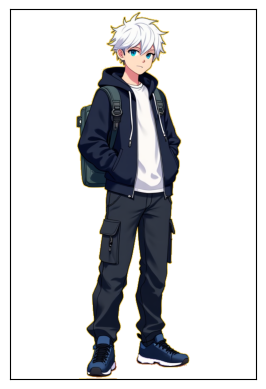

URL: https://photo.story-tech.ru/api/files/1655/original/jupyter_01655_.png
Status Code: 200
Content-Type: image/png


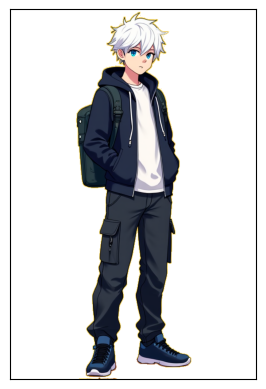

URL: https://photo.story-tech.ru/api/files/1656/original/jupyter_01656_.png
Status Code: 200
Content-Type: image/png


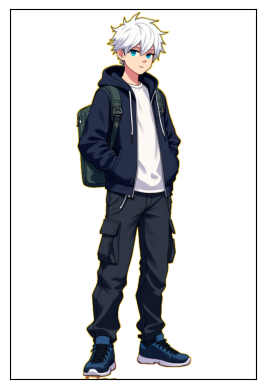

URL: https://photo.story-tech.ru/api/files/1657/original/jupyter_01657_.png
Status Code: 200
Content-Type: image/png


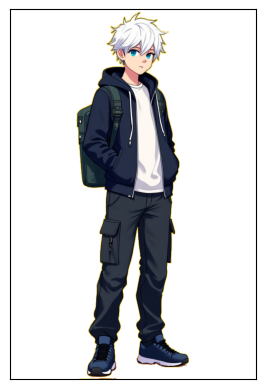

URL: https://photo.story-tech.ru/api/files/1658/original/jupyter_01658_.png
Status Code: 200
Content-Type: image/png


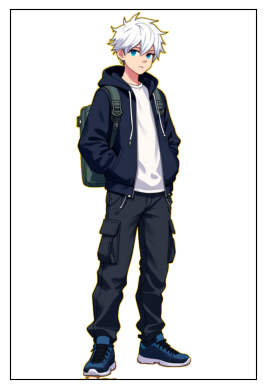

In [27]:
seed = 145153124385



emotions = ["happy", "shocked", "angry", "scared", "grimaced"]
filenames_character1 = {}

for emotion in emotions:
    try:
        filenames_character1[emotion] = get_image_generated_from_text(
            prompt_character1 + f"The character is very {emotion}.",
            512, 768, seed
        )
        time.sleep(50)
        img = remove_background(load_image_from_photofield(filenames_character1[emotion]))
        plt.imshow(img)
        plt.gca().axes.get_xaxis().set_visible(False)
        plt.gca().axes.get_yaxis().set_visible(False)
        plt.show()
    except Exception as e:
        print(f"Ошибка при обработке эмоции '{emotion}': {e}")
        continue

## Формирование промта для генерации второго персонажа

In [28]:
prompt_character2 = """A full-body character standing in the center of the image, detailed and vibrant, "with no shadows".
A character design for a game, on a very light yellow background.
""" + translate_text_on_eng(prompt_for_generate_image(character2)) + """. 
Art style: anime-style with clean lines, vibrant colors, and attention to small technological details."""

print(prompt_character2)

A full-body character standing in the center of the image, detailed and vibrant, "with no shadows".
A character design for a game, on a very light yellow background.
When depicting a character named "Vlad," consider the following features of his appearance:
The character "Vlad" is aged: 14-16 years old.
The character "Vlad" is: Male.
The character "Vlad" has: European appearance.
The character "Vlad"'s height: Not specified.
The character "Vlad"'s build (body shape): Stocky, especially in the abdomen and shoulder areas.
The character "Vlad"'s hair: Shaved head.
The character "Vlad"'s eye color: Not specified.
The character "Vlad"'s clothing: A gray-green sweater with many dark green stripes, long sleeves, dark gray pants with white stripes on the sides, white sneakers with green inserts.
Distinguishing features of the character "Vlad": ['Headphones around the neck']. 
Art style: anime-style with clean lines, vibrant colors, and attention to small technological details.


## Генерация изображений второго персонажа

URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


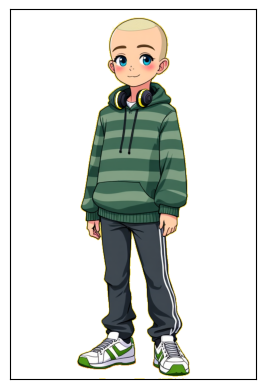

URL: https://photo.story-tech.ru/api/files/1660/original/jupyter_01660_.png
Status Code: 200
Content-Type: image/png


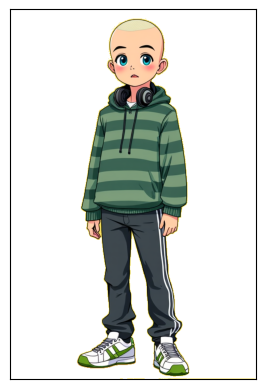

URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


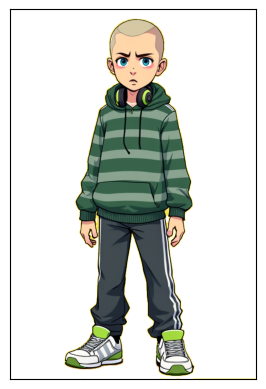

URL: https://photo.story-tech.ru/api/files/1662/original/jupyter_01662_.png
Status Code: 200
Content-Type: image/png


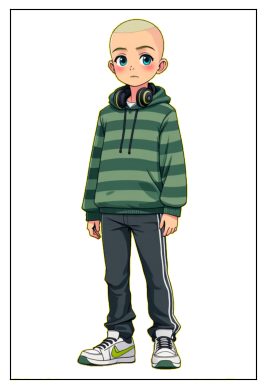

URL: https://photo.story-tech.ru/api/files/1663/original/jupyter_01663_.png
Status Code: 200
Content-Type: image/png


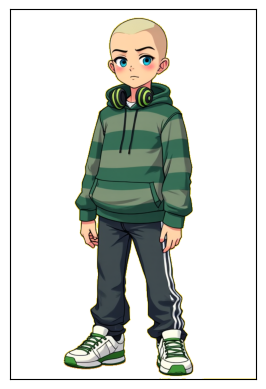

In [29]:
seed = 145153124382


emotions = ["happy", "shocked", "angry", "scared", "grimaced"]
filenames_character2 = {}

for emotion in emotions:
    try:
        filenames_character2[emotion] = get_image_generated_from_text(
            prompt_character2 + f"The character is very {emotion}.",
            512, 768, seed
        )
        time.sleep(50)
        img = remove_background(load_image_from_photofield(filenames_character2[emotion]))
        plt.imshow(img)
        plt.gca().axes.get_xaxis().set_visible(False)
        plt.gca().axes.get_yaxis().set_visible(False)
        plt.show()
    except Exception as e:
        print(f"Ошибка при обработке эмоции '{emotion}': {e}")
        continue

# 10. Запуск для генерации новеллы и упаковка в PPTX

## Генерация файла суммаризации:

In [30]:
OPENAI_API_KEY = OPENAI_API_KEY
proxy = proxy  # Укажите ваш прокси
summarizer = DocSummarizer(api_key=OPENAI_API_KEY)

input_file = r"2.1.docx"  # Путь к входному файлу
output_file = "output_summary.docx"  # Путь к выходному файлу
summarizer.process(input_file, output_file, max_tokens=800, proxy=proxy)

Суммаризованный текст успешно сохранен в output_summary.docx


## Генерация сюжета новеллы

In [31]:
doc_scenari = DocScenari(api_key=OPENAI_API_KEY)

summary_file = "output_summary.docx"
full_description_file = "2.1.docx"
output_file = "novel_plot.docx"

character1 = characters["Джей"]
character2 = characters["Влад"]
world_description_text = world_description  # убедитесь, что это строка

doc_scenari.process(
    summary_file=summary_file,
    full_description_file=full_description_file,
    output_file=output_file,
    p1=character1,
    p2=character2,
    world2=world_description_text,
    max_tokens=1500,
    proxy=proxy
)

Сгенерированный сюжет успешно сохранен в novel_plot.docx


## Генерация глав и сценария

In [32]:
# Генерация глав
plot_file = r"novel_plot.docx"
lecture_file = r"output_summary.docx"
output_file = r"output_scenario.docx"
characters = characters
world_description =world_description 


generator = ScenarioGenerator(api_key=OPENAI_API_KEY)

plot_file = r"novel_plot.docx"
lecture_file = r"output_summary.docx"
output_file = r"output_scenario.docx"

generator.process(
    plot_file=plot_file,
    lecture_file=lecture_file,
    output_file=output_file,
    characters=characters,
    world_desc=world_description,
    max_tokens=1500,
    proxy=proxy
)


full_text = read_doc(output_file)
chapters = split_into_chapters(full_text)

print(f"Найдено глав: {len(chapters)}")

previous_chapter_summary = ""  # Для первой главы нет предыдущих событий
for chapter in chapters:
    print(f"\n=== Обработка Главы {chapter['chapter_number']} ===\n")
    
    # Генерация сцен для текущей главы
    scenes = generate_scenes_for_chapter(
        chapter_text=chapter["content"],
        previous_chapter_summary=previous_chapter_summary,
        characters=characters,
        world_description=world_description,
        api_key=OPENAI_API_KEY,
        model="gpt-4o",
        max_tokens=1500,
        proxy=proxy
    )
    
    # Сохраняем сцены в файл
    write_doc(f"scenes_chapter_{chapter['chapter_number']}.docx", scenes)
    print(f"Сцены для Главы {chapter['chapter_number']} успешно сохранены.")

    # Обновляем краткое содержание для следующей главы
    previous_chapter_summary = f"Краткое содержание Главы {chapter['chapter_number']}: {scenes[:300]}..."


    Цель: Создать сценарий, разбитый на главы, каждая из которых объединяет несколько сцен.
    Для генерации используйте только входные данные.

    Входные данные:
    - Основной сюжет: **Основная идея сюжета:**

Научные концепции лекции о 3D-дизайне и компьютерной графике могут стать не только фоном для повествования, но и движущей силой сюжета. В школе Вавилон, где идет активное обучение взаимодействию с ИИ и программированию, Джей и Влад становятся частью тайной группы студентов. Они исследуют возможности использования 3D-графики не только для визуализации, но и для манипуляции реальностью в электронном мире школы. Это делает их целью для заговорщиков, которые хотят использовать эту технологию для собственных амбициозных планов.

**Конфликты и проблемы:**

- Открытие возможности 3D-дизайна для искажения реальности в виртуальном мире школы становится мощным инструментом. Это вызывает конфликт между студентами, кто хочет использовать эту технологию для добра, и теми, кто легко може

## Упаковка в pptx

### Поиск файлов с главами

In [33]:
pattern = re.compile('scenes_chapter_[0-9]+.docx')

scenes_chapters = [ _ for _ in os.listdir('.') if pattern.match(_) ]

scenes_chapters.sort(key=lambda x : int(x.split("_")[2].split(".")[0]))

print(scenes_chapters)

['scenes_chapter_1.docx', 'scenes_chapter_2.docx', 'scenes_chapter_3.docx', 'scenes_chapter_4.docx', 'scenes_chapter_5.docx']


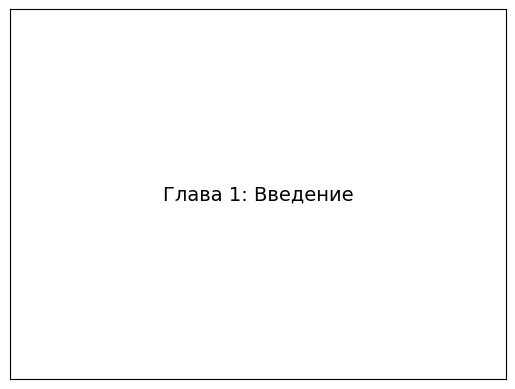

[{'background_description': 'Вавилон, вестибюль школы. В просторном, светлом помещении видны экраны с проекциями различных проектов учеников. ИИ приветствует всех входящих, идентифицируя их по цифровым жетонам. Светлые стены с далекими намёками на декоративные элементы high-tech. Экраны показывают анимации и проекты учеников.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'scared', 'dialogue': 'Кажется, у нас сегодня снова занятие по 3D. Интересно, что нового покажет преподаватель.', 'names': 'Джей'}, {'pictures1': 'happy', 'pictures2': 'scared', 'dialogue': 'Надеюсь, ничего сложного. Мне бы сначала разобраться с прошлой задачей...', 'names': 'Влад'}]}, {'background_description': 'Лекционный зал школы. Впереди аудиторный экран, на котором идёт презентация. Студенты усаживаются, активируя свои гаджеты. Проекционная доска с анимацией, передающей текстуры и формы. Лазерные указатели подчеркивают ключевые моменты презентации.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': '

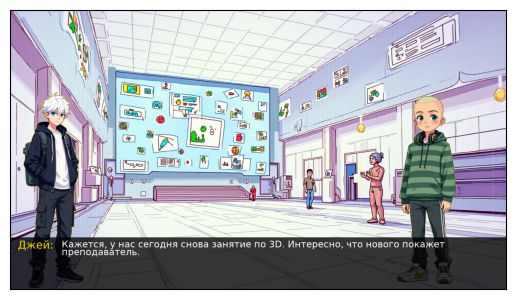

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1662/original/jupyter_01662_.png
Status Code: 200
Content-Type: image/png


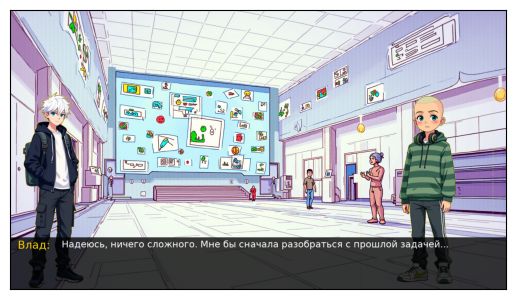

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1666/original/jupyter_01666_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


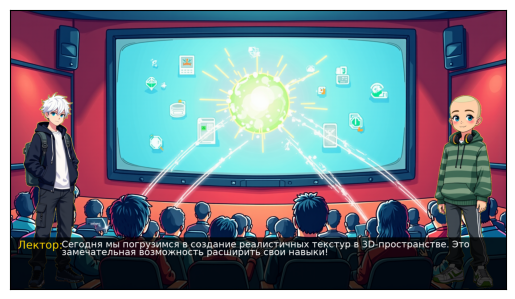

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


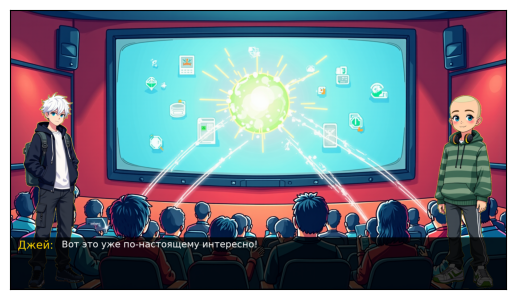

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1667/original/jupyter_01667_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1662/original/jupyter_01662_.png
Status Code: 200
Content-Type: image/png


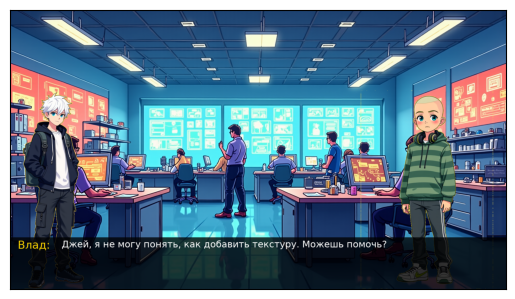

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


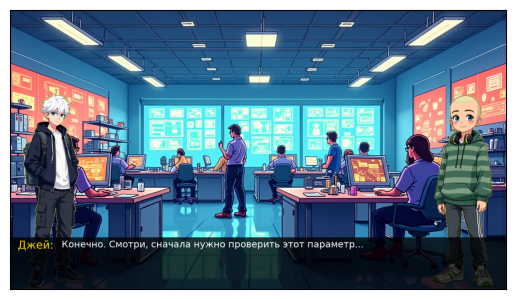

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1669/original/jupyter_01669_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


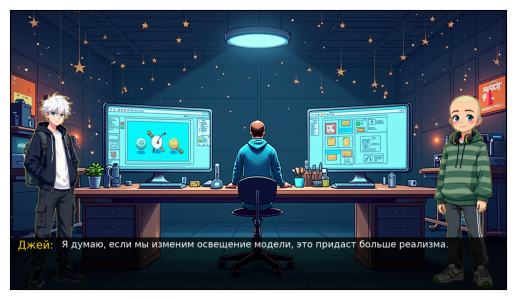

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


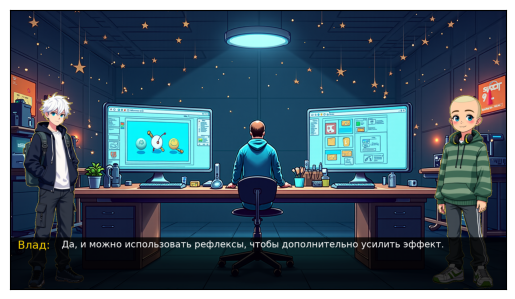

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1670/original/jupyter_01670_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


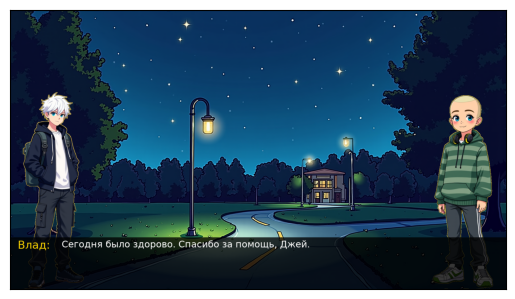

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


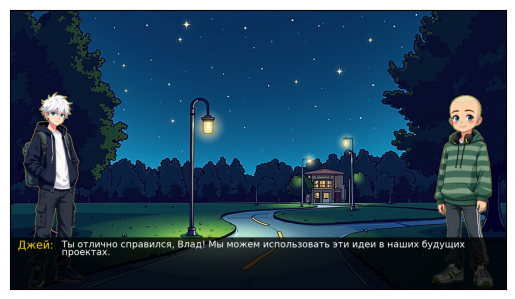

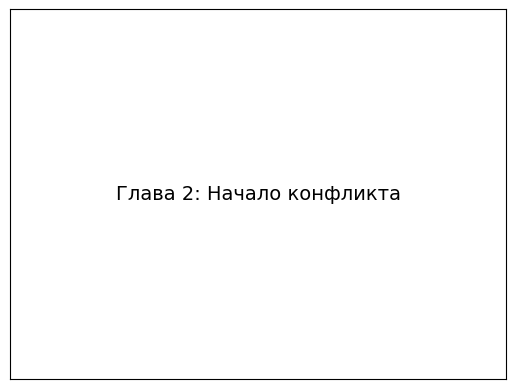

[{'background_description': 'Лаборатория 3D-дизайна в школе Вавилон. Просторная комната с высокими потолками, множество компьютерных терминалов и столов с оборудованием для 3D-печати. Свет пробивается через большие окна, заливая помещение мягким, равномерным светом. Яркие экраны компьютеров, звуки принтеров, мягкий свет сквозь окна, детализированные 3D-модели на экране.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'scared', 'dialogue': 'Смотри, Влад, я смог изменить текстуру стен в холле в реальном времени! Это как будто наш собственный виртуальный песочница!', 'names': 'Джей'}, {'pictures1': 'happy', 'pictures2': 'scared', 'dialogue': 'А ты уверен, что это безопасно? Школа ведь не просто набор пикселей.', 'names': 'Влад'}]}, {'background_description': 'Тот же лабораторный кабинет, но позже вечером. Атмосфера становится более таинственной из-за приглушенного освещения и пустоты помещения. Темные уголки комнаты, пульсации света на экранах, сдвиги теней по стенам.', 'miseenscen

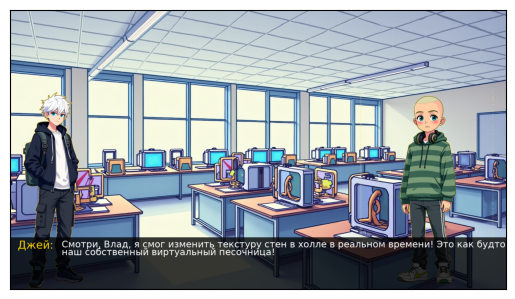

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1662/original/jupyter_01662_.png
Status Code: 200
Content-Type: image/png


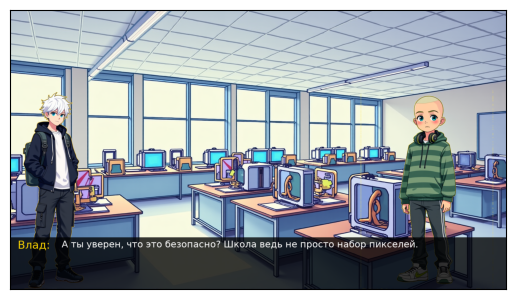

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1672/original/jupyter_01672_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1656/original/jupyter_01656_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


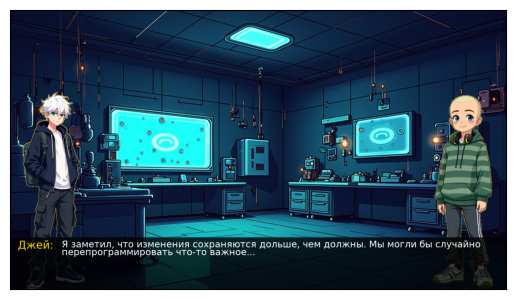

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


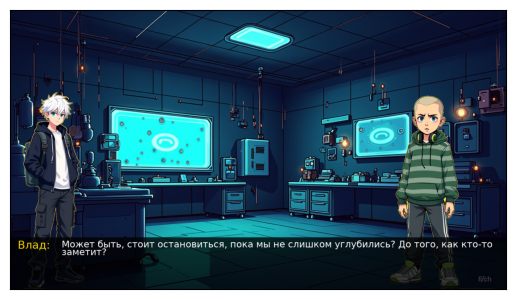

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1673/original/jupyter_01673_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


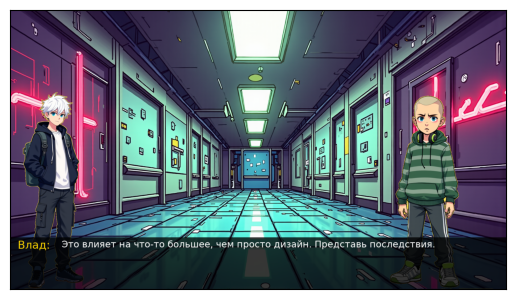

URL: https://photo.story-tech.ru/api/files/1657/original/jupyter_01657_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


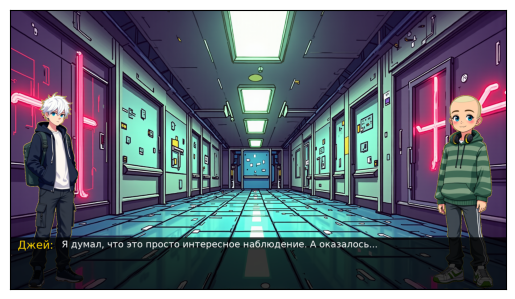

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1675/original/jupyter_01675_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1657/original/jupyter_01657_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


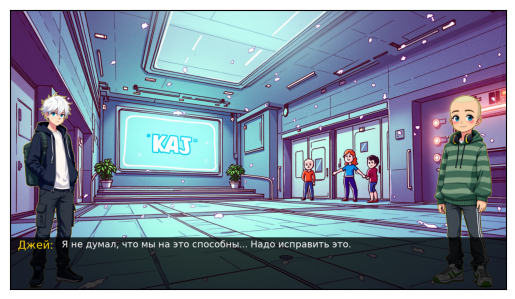

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


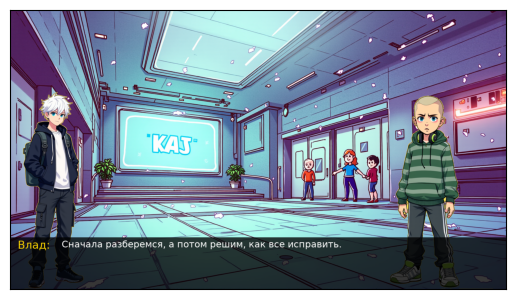

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1676/original/jupyter_01676_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


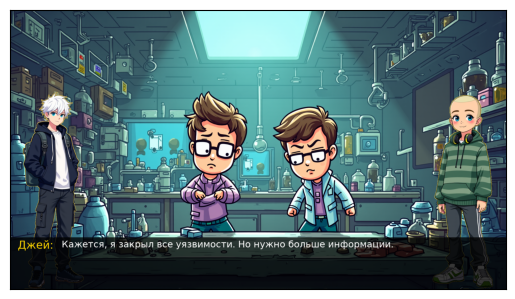

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


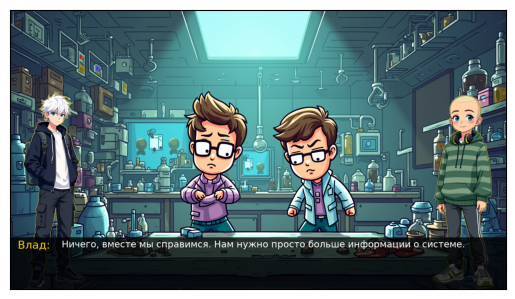

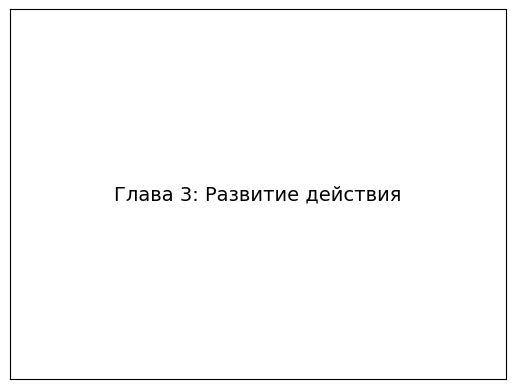

[{'background_description': 'Центральный коридор школы Вавилон. Широкий и средний по длине, с усыпкой из электроникой, экранов на стенах, периодически мигающих сообщениями от администрации и учеников. Дневной свет пробивается сквозь окна, создавая контрастные тени на полу. Сами экраны мерцают разными цветами, добавляя сюрреалистическую атмосферу.', 'miseenscenes': [{'pictures1': 'grimaced', 'pictures2': 'happy', 'dialogue': 'Влад, ты заметил, как внезапно изменились процедуры в школе? Что-то явно идёт не так.', 'names': 'Джей'}, {'pictures1': 'happy', 'pictures2': 'grimaced', 'dialogue': 'Я тоже заметил. Слышал, что кто-то начал менять параметры системы БУМов. Мы должны выяснить, кто это делает.', 'names': 'Влад'}]}, {'background_description': 'Подготовительный компьютерный класс школы, наполненный звуком работающих серверов и мерцанием мониторов. Полумрак в классе, свет от мониторов заливает лица персонажей, создавая игру светотени.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2

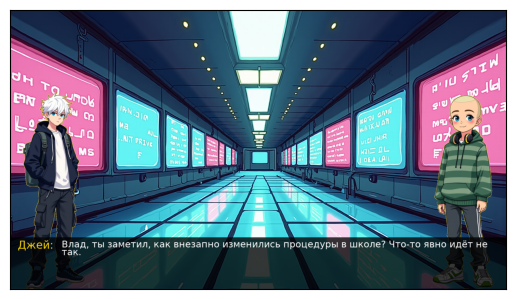

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1663/original/jupyter_01663_.png
Status Code: 200
Content-Type: image/png


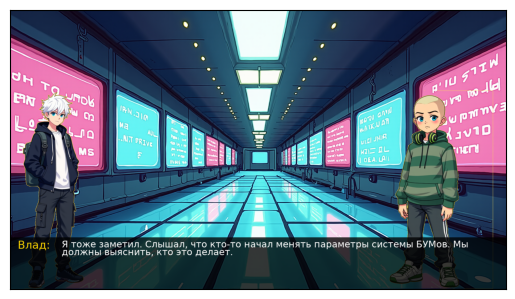

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1678/original/jupyter_01678_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1663/original/jupyter_01663_.png
Status Code: 200
Content-Type: image/png


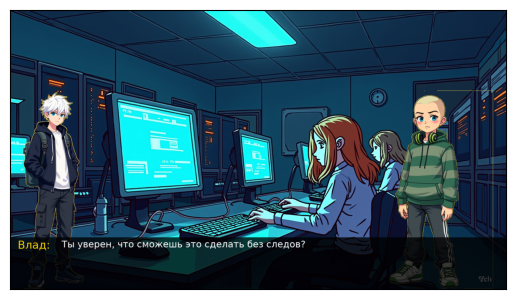

URL: https://photo.story-tech.ru/api/files/1658/original/jupyter_01658_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


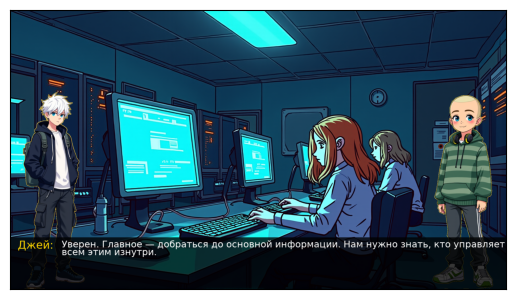

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1679/original/jupyter_01679_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


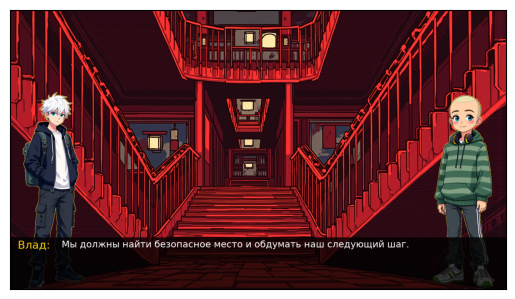

URL: https://photo.story-tech.ru/api/files/1657/original/jupyter_01657_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


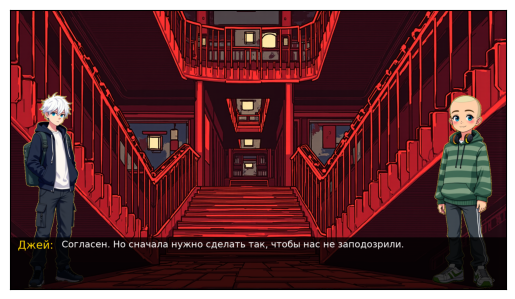

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1681/original/jupyter_01681_.png
Ошибка при загрузке (попытка 1): 404 Client Error: Not Found for url: https://photo.story-tech.ru/api/files/1681/original/jupyter_01681_.png
Попытка 2 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1681/original/jupyter_01681_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1658/original/jupyter_01658_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


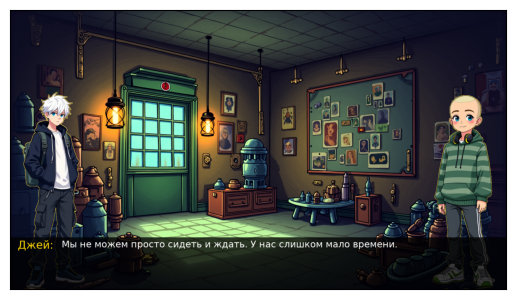

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


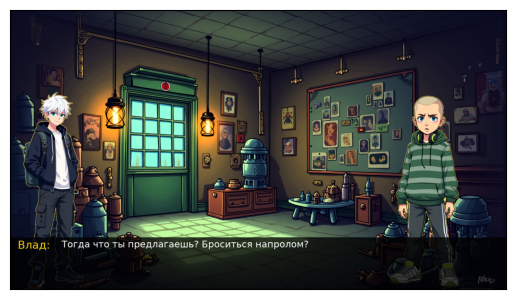

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1682/original/jupyter_01682_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1658/original/jupyter_01658_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


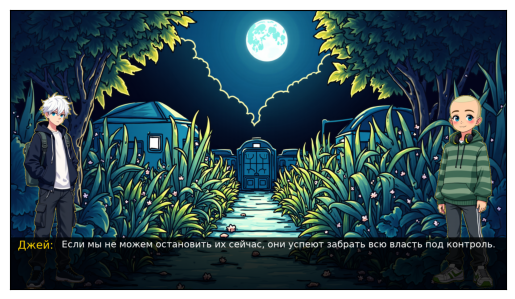

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


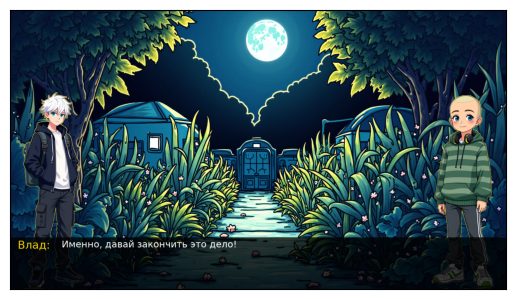

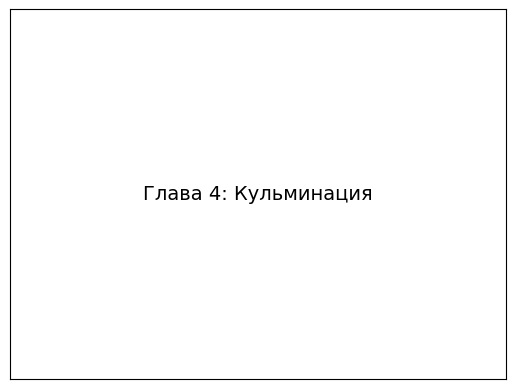

[{'background_description': 'Комната управления школы Вавилон. Процедурное помещение, усыпленное экранами, несколькими клавиатурами и интерфейсами для управления ИИ. Обстановка напоминает современный командный центр, освещённый ярким светом от мониторов. Пульсирующий свет экранов, создающий клубы тени на стенах. Серебристые панели, отражающие воспоминания недавних событий.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'happy', 'names': 'Джей', 'dialogue': 'Влад, спасибо за всё. Но сейчас нам нужно сосредоточиться.'}, {'pictures1': 'happy', 'pictures2': 'happy', 'names': 'Влад', 'dialogue': 'Я готов, Джей. Сначала отключим ловушки. Механика — моя сильная сторона.'}]}, {'background_description': 'Тёмный коридор за пределами комнаты управления. Узкие стены, желтоватый свет, мерцающий на поверхности. Узкие коридоры, где мерцают лампы. На стенах — датчики, реагирующие на движение.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'happy', 'names': 'Влад', 'dialogue': 'Здесь бу

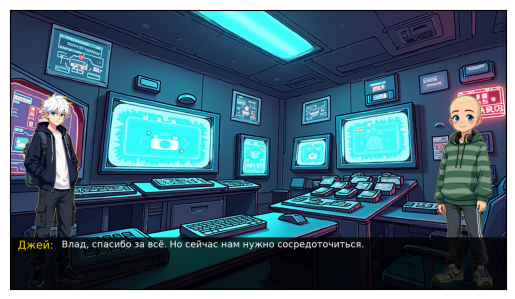

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


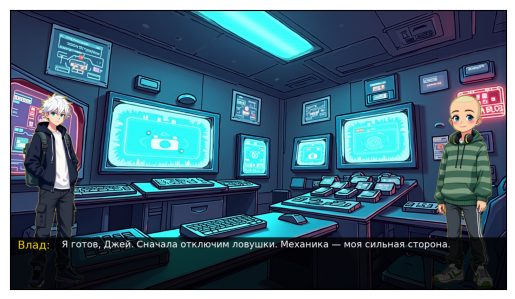

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1685/original/jupyter_01685_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


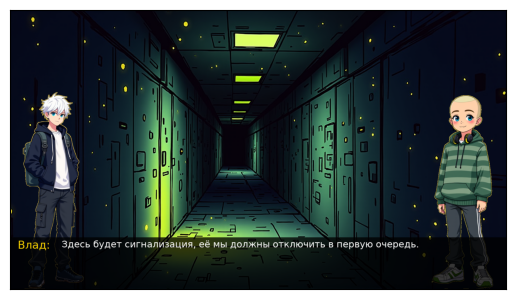

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


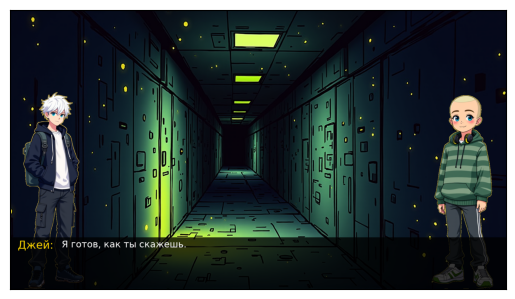

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1687/original/jupyter_01687_.png
Ошибка при загрузке (попытка 1): 404 Client Error: Not Found for url: https://photo.story-tech.ru/api/files/1687/original/jupyter_01687_.png
Попытка 2 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1687/original/jupyter_01687_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


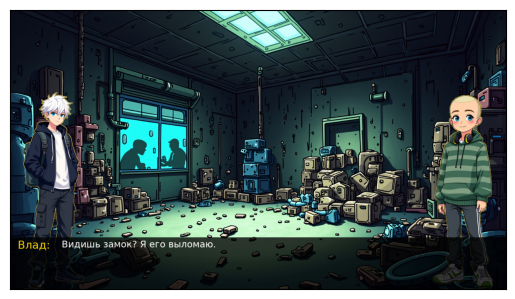

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


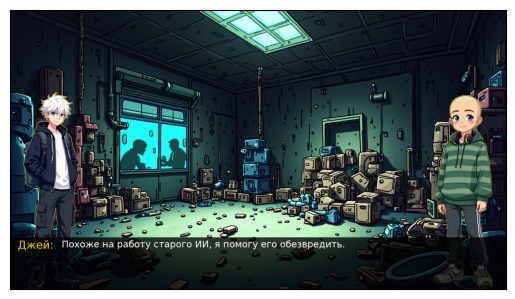

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1688/original/jupyter_01688_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1661/original/jupyter_01661_.png
Status Code: 200
Content-Type: image/png


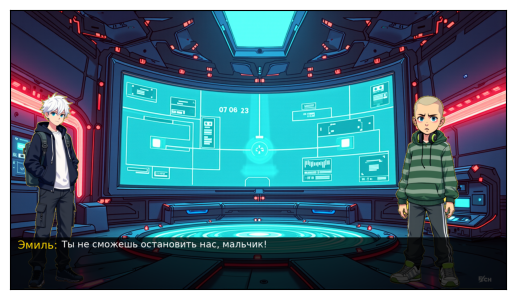

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


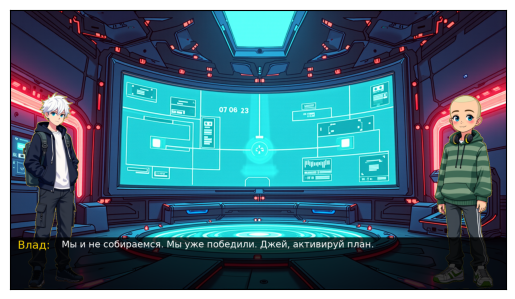

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1689/original/jupyter_01689_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


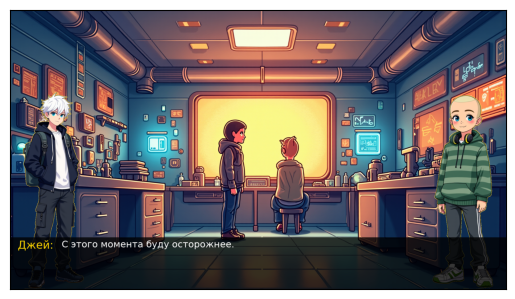

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


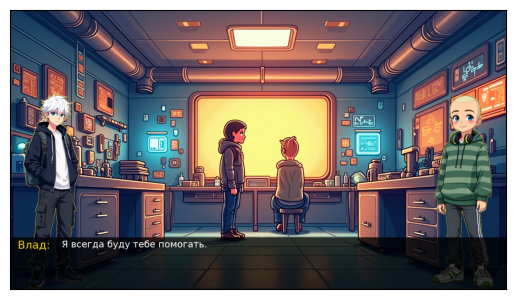

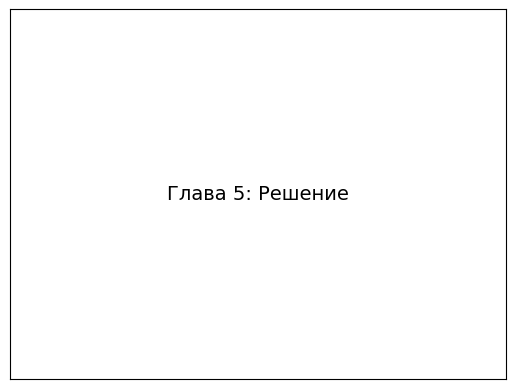

[{'background_description': 'Центральный холл школы Вавилон. Просторное помещение, освещенное солнечным светом через большие окна. Современные декорации, флора и экраны окружены высокими колоннами.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'happy', 'dialogue': 'Мы сделали это, Влад. Волнение закончилось.', 'names': 'Джей'}, {'pictures1': 'happy', 'pictures2': 'scared', 'dialogue': 'Да, но у нас впереди еще много работы. Нам нужно проявить себя с самого лучшего угла.', 'names': 'Влад'}]}, {'background_description': 'Компьютерная лаборатория. Современное пространство с множеством экранов и устройствами всемирной связи.', 'miseenscenes': [{'pictures1': 'happy', 'pictures2': 'happy', 'dialogue': 'Мы должны сделать ловушку надежной. Здесь пригодятся мои знания механики.', 'names': 'Влад'}, {'pictures1': 'happy', 'pictures2': 'happy', 'dialogue': 'Я бы не справился без твоих способностей, Влад. Все будет работать гладко.', 'names': 'Джей'}]}, {'background_description': 'Виртуаль

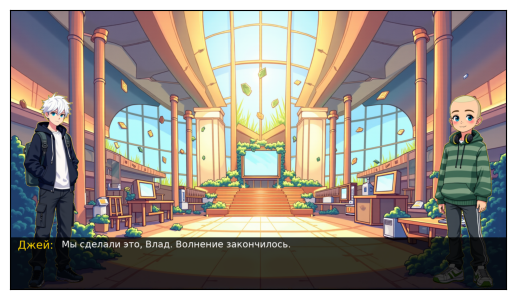

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1662/original/jupyter_01662_.png
Status Code: 200
Content-Type: image/png


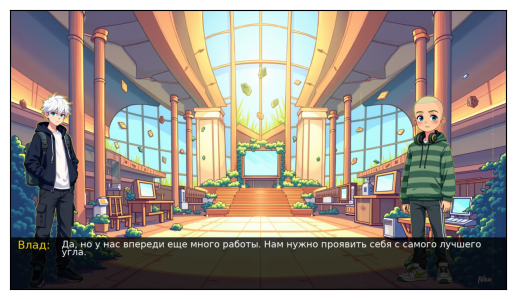

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1691/original/jupyter_01691_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


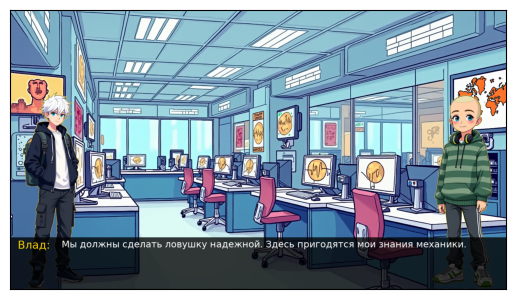

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


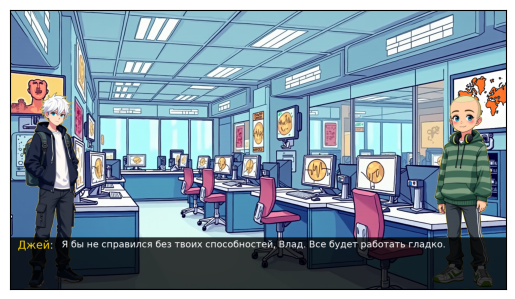

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1692/original/jupyter_01692_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1656/original/jupyter_01656_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


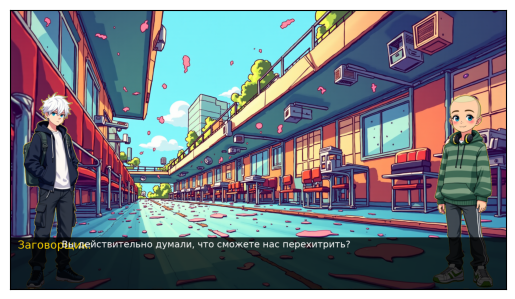

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


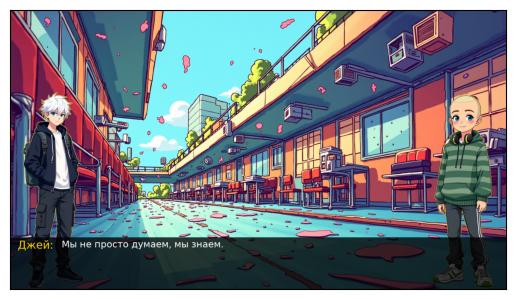

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1694/original/jupyter_01694_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


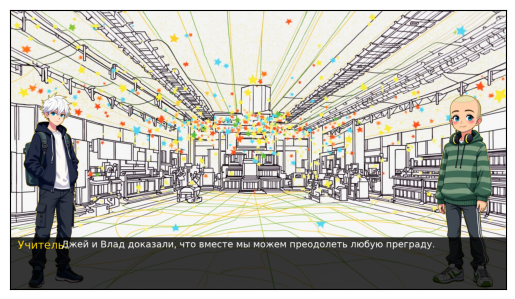

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


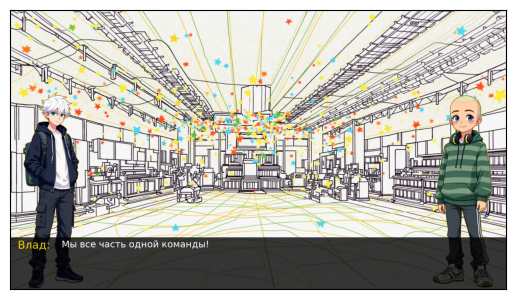

Попытка 1 из 20: Загрузка изображения с URL: https://photo.story-tech.ru/api/files/1695/original/jupyter_01695_.png
Изображение успешно загружено.
URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


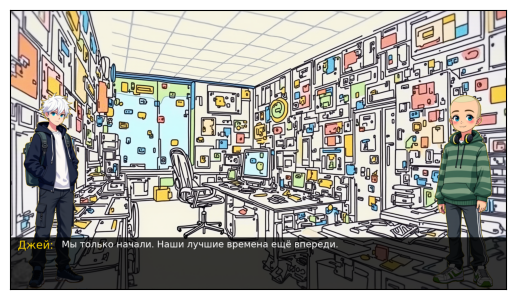

URL: https://photo.story-tech.ru/api/files/1654/original/jupyter_01654_.png
Status Code: 200
Content-Type: image/png
URL: https://photo.story-tech.ru/api/files/1659/original/jupyter_01659_.png
Status Code: 200
Content-Type: image/png


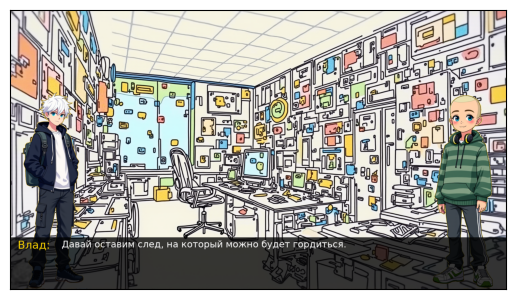

Презентация успешно сохранена как 'output_presentation.pptx'


In [34]:
presentation = Presentation()
for scenes_chapter in scenes_chapters:
    full_text = read_doc(scenes_chapter)
    
    answer = query_llm(f"""У тебя есть текст с названием главы, описанием сцен, места действия, репликах персонажей.
Тебе нужно превратить данный текст в словарь JSON, дав только ответ и никак не комментируя его. Не добавляй новых деталей.
Словарь JSON должен иметь следующие ключи: ключ "names" содержит строку с названием главы и её номером, ключ "scenes" со списком.
В списке по ключу "scenes" каждый элемент должен быть словарем JSON и описывать одну из сцен в тексте.
Словарь в списке "scenes" должен иметь ключи "background_description" и "miseenscenes".
Ключ "background_description" с описанием места действия и визуальными деталями. В этом описании не должны упоминаться персонажи.
Ключ "miseenscenes" содержит список, каждый элемент из которого является словарем.
Каждый элемент списка по ключу "miseenscenes" должен быть сделан на основе реплики одного из персонажей и содержать поля "pictures1", "pictures2", "dialogue", "names".
В поле "pictures1" должна быть одна из эмоций, наиболее подходящая для персонажа "{character1["name"]}" в процессе данного диалога.
Нужно выбрать только одну из следующих эмоций: "happy", "shocked", "angry", "scared", "grimaced". Если эмоция неописанна или неясно обозначена то используем "happy".
В поле "pictures2" должна быть одна из эмоций, наиболее подходящая для персонажа "{character2["name"]}" в процессе данного диалога.
Нужно выбрать только одну из следующих эмоций: "happy", "shocked", "angry", "scared", "grimaced". Если эмоция неописанна или неясно обозначена то используем "happy".
В поле "names" должно быть указано имя персонажа для данной реплики.
В поле "dialogue" должен быть указан текст с репликой персонажа.
Текст с описанием главы:

-------
{full_text}""")
    data = json.loads(answer[answer.index("{"):answer.rindex("}") + 1])

    plt.text(0.5, 0.5, data["names"], fontsize=14, ha='center', va='center')
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.show()
    
    scenes = data["scenes"]

    print(scenes)
    
    for i in range(len(scenes)):
        # Генерация фонового изображения
        background_name = get_image_generated_from_text(
            translate_text_on_eng(scenes[i]["background_description"]) + """
            Art style: doodle-style with clean lines, vibrant colors, and attention to small technological details.""",
            1920, 1080  # Разрешение фона подходит для презентации
        )
        
        if not background_name:
            raise ValueError("Не удалось получить имя фонового изображения.")
        
        try:
            # Генерация фонового изображения
            background_name = get_image_generated_from_text(
            translate_text_on_eng(scenes[i]["background_description"]) + """
            Art style: doodle-style with clean lines, vibrant colors, and attention to small technological details.""",
            1920, 1080  # Разрешение фона подходит для презентации
            )
            
            if not background_name:
                raise ValueError("Не удалось получить имя фонового изображения.")
        
            # Формирование URL для загрузки
            url = (
                "https://photo.story-tech.ru/api/files/" + 
                background_name.split("_")[1].lstrip("0") + 
                "/original/" + 
                background_name
            )
        
            # Загрузка фонового изображения с повторными попытками
            background = load_image_with_retries(url, max_attempts=20, delay=5)
        
            # Изменение размера фона (соответствует размеру слайда презентации)
            background = background.resize((1920, 1080))
        
        except Exception as e:
            print(f"Критическая ошибка: {e}")
            raise
        
        for j in range(len(scenes[i]["miseenscenes"])):
            # Создаем изображение для текущей мизансцены
            scene_image = background.copy()

            # Загружаем и масштабируем персонажей
            ch1 = remove_background(load_image_from_photofield(filenames_character1[scenes[i]["miseenscenes"][j]["pictures1"]]))
            ch1 = ch1.crop(ch1.getbbox())
            ch1.thumbnail((int(background.size[0] * 0.2 * 2.5), int(background.size[1] * 0.3 * 2.5)), Image.Resampling.LANCZOS)
            scene_image.paste(ch1, (50, scene_image.size[1] - ch1.size[1]), ch1)

            ch2 = remove_background(load_image_from_photofield(filenames_character2[scenes[i]["miseenscenes"][j]["pictures2"]]))
            ch2 = ch2.crop(ch2.getbbox())
            ch2.thumbnail((int(background.size[0] * 0.2 * 2.5), int(background.size[1] * 0.3 * 2.5)), Image.Resampling.LANCZOS)
            scene_image.paste(ch2, (scene_image.size[0] - ch2.size[0] - 50, scene_image.size[1] - ch2.size[1]), ch2)
            create_dipanel(scene_image, [scenes[i]["miseenscenes"][j]["dialogue"]], [scenes[i]["miseenscenes"][j]["names"]])
            
            temp_image_path = f"temp_scene_{i}_{j}.png"
            scene_image.save(temp_image_path)

            # Добавляем изображение на слайд презентации
            slide = presentation.slides.add_slide(presentation.slide_layouts[5])  # Пустой слайд
            left = top = Inches(0.5)  # Положение изображения на слайде
            slide.shapes.add_picture(temp_image_path, left, top, width=Inches(8), height=Inches(4.5))  # Адаптировано под 16:9
            
            plt.imshow(scene_image)
            plt.gca().axes.get_xaxis().set_visible(False)
            plt.gca().axes.get_yaxis().set_visible(False)
            plt.show()

# Сохранение презентации
try:
    presentation.save("output_presentation.pptx")
    print("Презентация успешно сохранена как 'output_presentation.pptx'")
except Exception as e:
    print(f"Ошибка при сохранении презентации: {e}")